# Телеком — задача проекта

Оператор связи «Ниединогоразрыва.ком» хочет научиться прогнозировать отток клиентов. Если выяснится, что пользователь планирует уйти, ему будут предложены промокоды и специальные условия. Команда оператора собрала персональные данные о некоторых клиентах, информацию об их тарифах и договорах.

## Описание услуг

Оператор предоставляет два основных типа услуг: 

1. Стационарную телефонную связь. Возможно подключение телефонного аппарата к нескольким линиям одновременно.
2. Интернет. Подключение может быть двух типов: через телефонную линию (DSL*,* от англ. *digital subscriber line*, «цифровая абонентская линия») или оптоволоконный кабель (*Fiber optic*).  

Также доступны такие услуги:

- Интернет-безопасность: антивирус (*DeviceProtection*) и блокировка небезопасных сайтов (*OnlineSecurity*);
- Выделенная линия технической поддержки (*TechSupport*);
- Облачное хранилище файлов для резервного копирования данных (*OnlineBackup*);
- Стриминговое телевидение (*StreamingTV*) и каталог фильмов (*StreamingMovies*).

За услуги клиенты могут платить каждый месяц или заключить договор на 1–2 года. Доступны различные способы расчёта и возможность получения электронного чека.

## Описание данных

Данные состоят из файлов, полученных из разных источников:

- `contract.csv` — информация о договоре;
- `personal.csv` — персональные данные клиента;
- `internet.csv` — информация об интернет-услугах;
- `phone.csv` — информация об услугах телефонии.

Во всех файлах столбец `customerID` содержит код клиента.

Информация о договорах актуальна на 1 февраля 2020.

## Данные

[final_provider.zip](https://s3-us-west-2.amazonaws.com/secure.notion-static.com/ac39c23b-718e-4cd6-bdaa-85b3a127a457/final_provider.zip)

Данные также находятся в тренажёре, в папке `/datasets/final_provider/`.

In [3]:
# импортируем библиотеку pandas
import pandas as pd
# импортируем библиотеку numpy
import numpy as np
# импортируем библиотеки, с помощью которой будем строить графики
import plotly.graph_objects as go
import plotly.express as px
import matplotlib.pyplot as plt

# импортируем ProfileReport
from ydata_profiling import ProfileReport

# добавим случайности нашей функции, чтобы каждый раз брался разный сэмпл
from numpy.random import RandomState

# импортируем функции для подготовки признаков
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.compose import make_column_transformer
from sklearn.preprocessing import OrdinalEncoder
import imblearn
from imblearn.over_sampling import SMOTE

# импортируем модели
import lightgbm as lgb
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from catboost import CatBoostClassifier
from sklearn.ensemble import ExtraTreesClassifier
from tensorflow.keras import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout
import tensorflow

# импортируем метод для подобора наилучших параметров 
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# импортируем cross_validate и метрики из sklearn
from sklearn.model_selection import cross_validate
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import recall_score
from sklearn.metrics import precision_score
from sklearn.metrics import roc_curve

# импортируем функцию LabelEncoder
from sklearn.preprocessing import LabelEncoder

# импортируем метрику rmse
from sklearn.metrics import mean_squared_error, confusion_matrix, recall_score

from sklearn.exceptions import ConvergenceWarning
import warnings

In [4]:
warnings.filterwarnings("ignore")

In [5]:
# зададим RandomState
RANDOM_STATE = RandomState(270223)

# Открытие данных и изучение информации

Считаем данные со всех файлов и запишем их в отдельные переменные. Также рассмотрим основную информацию по ним с помощью

In [6]:
# считываем csv-файл contract.csv датасета в перемнную df_contracts с использованием разделителей ','
try:
    df_contracts = pd.read_csv('contract.csv', sep=',')
except:
    df_contracts = pd.read_csv('/datasets/final_provider/contract.csv', sep=',')

In [7]:
# рассмотрим данные
df_contracts.head()

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65


In [8]:
# рассмотрим данные
df_contracts.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
dtypes: float64(1), object(7)
memory usage: 440.3+ KB


In [9]:
# рассмотрим данные с помощью describe
df_contracts.describe()

,MonthlyCharges
count,7043.000000
mean,64.761692
std,30.090047
min,18.250000
25%,35.500000
50%,70.350000
75%,89.850000
max,118.750000


In [10]:
# считываем csv-файл personal.csv датасета в перемнную df_personal с использованием разделителей ','
try:
    df_personal = pd.read_csv('personal.csv', sep=',')
except:
    df_personal = pd.read_csv('/datasets/final_provider/personal.csv', sep=',')

In [11]:
# рассмотрим данные
df_personal.head()

,customerID,gender,SeniorCitizen,Partner,Dependents
0,7590-VHVEG,Female,0,Yes,No
1,5575-GNVDE,Male,0,No,No
2,3668-QPYBK,Male,0,No,No
3,7795-CFOCW,Male,0,No,No
4,9237-HQITU,Female,0,No,No


In [12]:
# рассмотрим данные
df_personal.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 5 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     7043 non-null   object
 1   gender         7043 non-null   object
 2   SeniorCitizen  7043 non-null   int64 
 3   Partner        7043 non-null   object
 4   Dependents     7043 non-null   object
dtypes: int64(1), object(4)
memory usage: 275.2+ KB


In [13]:
# рассмотрим данные с помощью describe
df_personal.describe()

,SeniorCitizen
count,7043.000000
mean,0.162147
std,0.368612
min,0.000000
25%,0.000000
50%,0.000000
75%,0.000000
max,1.000000


In [14]:
# считываем csv-файл internet.csv датасета в перемнную df_internet с использованием разделителей ','
try:
    df_internet = pd.read_csv('internet.csv', sep=',')
except:
    df_internet = pd.read_csv('/datasets/final_provider/internet.csv', sep=',')

In [15]:
# рассмотрим данные
df_internet.head()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,Fiber optic,No,No,No,No,No,No


In [16]:
# рассмотрим данные
df_internet.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5517 entries, 0 to 5516
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   customerID        5517 non-null   object
 1   InternetService   5517 non-null   object
 2   OnlineSecurity    5517 non-null   object
 3   OnlineBackup      5517 non-null   object
 4   DeviceProtection  5517 non-null   object
 5   TechSupport       5517 non-null   object
 6   StreamingTV       5517 non-null   object
 7   StreamingMovies   5517 non-null   object
dtypes: object(8)
memory usage: 344.9+ KB


In [17]:
# рассмотрим данные с помощью describe
df_internet.describe()

,customerID,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
count,5517,5517,5517,5517,5517,5517,5517,5517
unique,5517,2,2,2,2,2,2,2
top,7590-VHVEG,Fiber optic,No,No,No,No,No,No
freq,1,3096,3498,3088,3095,3473,2810,2785


In [18]:
# считываем csv-файл phone.csv датасета в перемнную df_phone с использованием разделителей ','
try:
    df_phone = pd.read_csv('phone.csv', sep=',')
except:
    df_phone = pd.read_csv('/datasets/final_provider/phone.csv', sep=',')

In [19]:
# рассмотрим данные
df_phone.head()

,customerID,MultipleLines
0,5575-GNVDE,No
1,3668-QPYBK,No
2,9237-HQITU,No
3,9305-CDSKC,Yes
4,1452-KIOVK,Yes


In [20]:
# рассмотрим данные
df_phone.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6361 entries, 0 to 6360
Data columns (total 2 columns):
 #   Column         Non-Null Count  Dtype 
---  ------         --------------  ----- 
 0   customerID     6361 non-null   object
 1   MultipleLines  6361 non-null   object
dtypes: object(2)
memory usage: 99.5+ KB


In [21]:
# рассмотрим данные с помощью describe
df_phone.describe()

,customerID,MultipleLines
count,6361,6361
unique,6361,2
top,5575-GNVDE,No
freq,1,3390


**Выводы**

По датасетам мы можем наблюдать следующее:
- данные выгружаются корректно
- в наличии данные о 7043 клиентах компании, из них 5517 воспользовались услугами предоставления интернета и 6361 услугами телефонной связи
- необходимо скорретировать названия столбцов в соответствие с принятым стилем
- стоит поменять тип данным в столбцах в соответствие с содержимым
- можно объединить датасеты в один для последующей предобработки с помощью ID клиента

# Предобработка данных

## Объединение данных

In [22]:
# создадим переменную df_full
df_full = df_contracts

Объединим данные в датасете `df_full`

In [23]:
# объединим данные с помощью функции merge
df_full = df_full.merge(df_personal, on='customerID', how='left')
df_full = df_full.merge(df_internet, on='customerID', how='left')
df_full = df_full.merge(df_phone, on='customerID', how='left')

In [24]:

df_full

,customerID,BeginDate,EndDate,Type,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,gender,SeniorCitizen,Partner,Dependents,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies,MultipleLines
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,NaN
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,NaN
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,2018-02-01,No,One year,Yes,Mailed check,84.80,1990.5,Male,0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,Yes
7039,2234-XADUH,2014-02-01,No,One year,Yes,Credit card (automatic),103.20,7362.9,Female,0,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Yes
7040,4801-JZAZL,2019-03-01,No,Month-to-month,Yes,Electronic check,29.60,346.45,Female,0,Yes,Yes,DSL,Yes,No,No,No,No,No,NaN
7041,8361-LTMKD,2019-07-01,2019-11-01 00:00:00,Month-to-month,Yes,Mailed check,74.40,306.6,Male,1,Yes,No,Fiber optic,No,No,No,No,No,No,Yes


In [25]:
# рассмотрим данные
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   customerID        7043 non-null   object 
 1   BeginDate         7043 non-null   object 
 2   EndDate           7043 non-null   object 
 3   Type              7043 non-null   object 
 4   PaperlessBilling  7043 non-null   object 
 5   PaymentMethod     7043 non-null   object 
 6   MonthlyCharges    7043 non-null   float64
 7   TotalCharges      7043 non-null   object 
 8   gender            7043 non-null   object 
 9   SeniorCitizen     7043 non-null   int64  
 10  Partner           7043 non-null   object 
 11  Dependents        7043 non-null   object 
 12  InternetService   5517 non-null   object 
 13  OnlineSecurity    5517 non-null   object 
 14  OnlineBackup      5517 non-null   object 
 15  DeviceProtection  5517 non-null   object 
 16  TechSupport       5517 non-null   object 


<div class="alert alert-block alert-success"; style="border-left: 6px solid green">
<b>Успех ✔️</b>
       
Объединение сделано корректно!
    
</div>


In [26]:
# сразу переименуем столбцы в соответствие с принятым стилем
df_full = df_full.rename(columns={'customerID': 'customer_id',
                                 'BeginDate': 'begin_date',
                                 'EndDate': 'end_date',
                                 'Type': 'type',
                                 'PaperlessBilling': 'paperless_billing',
                                 'PaymentMethod': 'payment_method',
                                 'MonthlyCharges': 'monthly_charges',
                                 'TotalCharges': 'total_charges',
                                 'SeniorCitizen': 'senior_citizen',
                                 'Partner': 'partner',
                                 'Dependents': 'dependents',
                                 'InternetService': 'internet_service',
                                 'OnlineSecurity': 'online_security',
                                 'OnlineBackup': 'online_backup',
                                 'DeviceProtection': 'device_protection',
                                 'TechSupport': 'tech_support',
                                 'StreamingTV': 'streaming_tv',
                                 'StreamingMovies': 'streaming_movies',
                                 'MultipleLines': 'multiple_lines'}) 

In [27]:
# рассмотрим данные
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7043 non-null   object 
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   int64  
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   5517 non-null   object 
 13  online_security    5517 non-null   object 
 14  online_backup      5517 non-null   object 
 15  device_protection  5517 non-null   object 
 16  tech_support       5517 

Было произведено объединение датасетов в один и обработаны названия столбцов. В объединенном датасете появились пропуски. Попробуем их обработать

## Обработка пропусков

Рассмотрим количество пропусков в каждом столбце

In [28]:
#посчитаем количество ожиадаемах пропусков в каждом столбце
df_full.isna().sum()

customer_id             0
begin_date              0
end_date                0
type                    0
paperless_billing       0
payment_method          0
monthly_charges         0
total_charges           0
gender                  0
senior_citizen          0
partner                 0
dependents              0
internet_service     1526
online_security      1526
online_backup        1526
device_protection    1526
tech_support         1526
streaming_tv         1526
streaming_movies     1526
multiple_lines        682
dtype: int64

Наличие пропусков свидетельствует об отсутствии предоставления услуг интернета и телефонной связи с части клиентов. Даннеы пропуски мы заменим выражением `No service`

In [29]:
# с помощью цикла заполним пропуски
for row in df_full.columns:
    df_full[row] = df_full[row].fillna('No')

In [30]:
#посчитаем количество ожиадаемах пропусков в каждом столбце
df_full.isna().sum()

customer_id          0
begin_date           0
end_date             0
type                 0
paperless_billing    0
payment_method       0
monthly_charges      0
total_charges        0
gender               0
senior_citizen       0
partner              0
dependents           0
internet_service     0
online_security      0
online_backup        0
device_protection    0
tech_support         0
streaming_tv         0
streaming_movies     0
multiple_lines       0
dtype: int64

Видим, что пропусков в датасете теперь нет. Рассмотрим данные

In [31]:
# рассмотрим данные
df_full

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
0,7590-VHVEG,2020-01-01,No,Month-to-month,Yes,Electronic check,29.85,29.85,Female,0,Yes,No,DSL,No,Yes,No,No,No,No,No
1,5575-GNVDE,2017-04-01,No,One year,No,Mailed check,56.95,1889.5,Male,0,No,No,DSL,Yes,No,Yes,No,No,No,No
2,3668-QPYBK,2019-10-01,2019-12-01 00:00:00,Month-to-month,Yes,Mailed check,53.85,108.15,Male,0,No,No,DSL,Yes,Yes,No,No,No,No,No
3,7795-CFOCW,2016-05-01,No,One year,No,Bank transfer (automatic),42.30,1840.75,Male,0,No,No,DSL,Yes,No,Yes,Yes,No,No,No
4,9237-HQITU,2019-09-01,2019-11-01 00:00:00,Month-to-month,Yes,Electronic check,70.70,151.65,Female,0,No,No,Fiber optic,No,No,No,No,No,No,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,6840-RESVB,2018-02-01,No,One year,Yes,Mailed check,84.80,1990.5,Male,0,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,Yes,Yes
7039,2234-XADUH,2014-02-01,No,One year,Yes,Credit card (automatic),103.20,7362.9,Female,0,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Yes
7040,4801-JZAZL,2019-03-01,No,Month-to-month,Yes,Electronic check,29.60,346.45,Female,0,Yes,Yes,DSL,Yes,No,No,No,No,No,No
7041,8361-LTMKD,2019-07-01,2019-11-01 00:00:00,Month-to-month,Yes,Mailed check,74.40,306.6,Male,1,Yes,No,Fiber optic,No,No,No,No,No,No,Yes


## Обработка дубликатов

In [32]:
# выведем количество дубликатов в датасете
display(df_full.duplicated().sum())

0

Дубликаты в датасете отсутствуют

## Изменение типа данных

Рассмотрим типы данных и скорректируем их

In [33]:
# рассмотрим данные
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   customer_id        7043 non-null   object 
 1   begin_date         7043 non-null   object 
 2   end_date           7043 non-null   object 
 3   type               7043 non-null   object 
 4   paperless_billing  7043 non-null   object 
 5   payment_method     7043 non-null   object 
 6   monthly_charges    7043 non-null   float64
 7   total_charges      7043 non-null   object 
 8   gender             7043 non-null   object 
 9   senior_citizen     7043 non-null   int64  
 10  partner            7043 non-null   object 
 11  dependents         7043 non-null   object 
 12  internet_service   7043 non-null   object 
 13  online_security    7043 non-null   object 
 14  online_backup      7043 non-null   object 
 15  device_protection  7043 non-null   object 
 16  tech_support       7043 

Из информации о датасете видим, что необходимо поменять тип данных в столбцах `begin_date` на **datetime64**, т.к. здесь указана дата начала оказания услуг и дата окончания, в `total_charges` на **float64**, т.к. значения в данном столбце носят численный характер. Данные в столбцах `senior_citizen` можно поменять на тип **bool**

In [34]:
try:
    df_full['total_charges'] = pd.to_numeric(df_full['total_charges'], errors='coerce') 
    df_full['total_charges'] = df_full['total_charges'].astype('float')
except:
    print('в', column, 'не получилось поменять тип')

In [35]:
# поменяем тип данных в столбце begin_date
df_full['begin_date'] = pd.to_datetime(df_full['begin_date'], format='%Y-%m-%dT%H:%M:%S')

In [36]:
# поменяем тип данных столбцов с проверкой возможности замены с помощью try-except
try:
    df_full['senior_citizen'] = df_full['senior_citizen'].astype(bool)
except:
    print('в', column, 'не получилось поменять тип')

In [37]:
# рассмотрим данные
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   object        
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7032 non-null   float64       
 8   gender             7043 non-null   object        
 9   senior_citizen     7043 non-null   bool          
 10  partner            7043 non-null   object        
 11  dependents         7043 non-null   object        
 12  internet_service   7043 non-null   object        
 13  online_security    7043 non-null   object        
 14  online_b

In [38]:
df_full[df_full['total_charges'].isna()]

,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines
488,4472-LVYGI,2020-02-01,No,Two year,Yes,Bank transfer (automatic),52.55,NaN,Female,False,Yes,Yes,DSL,Yes,No,Yes,Yes,Yes,No,No
753,3115-CZMZD,2020-02-01,No,Two year,No,Mailed check,20.25,NaN,Male,False,No,Yes,No,No,No,No,No,No,No,No
936,5709-LVOEQ,2020-02-01,No,Two year,No,Mailed check,80.85,NaN,Female,False,Yes,Yes,DSL,Yes,Yes,Yes,No,Yes,Yes,No
1082,4367-NUYAO,2020-02-01,No,Two year,No,Mailed check,25.75,NaN,Male,False,Yes,Yes,No,No,No,No,No,No,No,Yes
1340,1371-DWPAZ,2020-02-01,No,Two year,No,Credit card (automatic),56.05,NaN,Female,False,Yes,Yes,DSL,Yes,Yes,Yes,Yes,Yes,No,No
3331,7644-OMVMY,2020-02-01,No,Two year,No,Mailed check,19.85,NaN,Male,False,Yes,Yes,No,No,No,No,No,No,No,No
3826,3213-VVOLG,2020-02-01,No,Two year,No,Mailed check,25.35,NaN,Male,False,Yes,Yes,No,No,No,No,No,No,No,Yes
4380,2520-SGTTA,2020-02-01,No,Two year,No,Mailed check,20.00,NaN,Female,False,Yes,Yes,No,No,No,No,No,No,No,No
5218,2923-ARZLG,2020-02-01,No,One year,Yes,Mailed check,19.70,NaN,Male,False,Yes,Yes,No,No,No,No,No,No,No,No
6670,4075-WKNIU,2020-02-01,No,Two year,No,Mailed check,73.35,NaN,Female,False,Yes,Yes,DSL,No,Yes,Yes,Yes,Yes,No,Yes


In [39]:
# заполним пропуски в столбце total_charges для клиентов, которые еще не вносили оплаты заа услуги
df_full['total_charges'] = df_full['total_charges'].fillna(0)

In [40]:
# рассмотрим данные
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 20 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   customer_id        7043 non-null   object        
 1   begin_date         7043 non-null   datetime64[ns]
 2   end_date           7043 non-null   object        
 3   type               7043 non-null   object        
 4   paperless_billing  7043 non-null   object        
 5   payment_method     7043 non-null   object        
 6   monthly_charges    7043 non-null   float64       
 7   total_charges      7043 non-null   float64       
 8   gender             7043 non-null   object        
 9   senior_citizen     7043 non-null   bool          
 10  partner            7043 non-null   object        
 11  dependents         7043 non-null   object        
 12  internet_service   7043 non-null   object        
 13  online_security    7043 non-null   object        
 14  online_b

## Обработка аномальных значений

In [41]:
# чиссленные показатели в датасете, минимальных и максимальных показателях 
(
    df_full[['total_charges', 'monthly_charges']]
    .apply (['count', 'min', 'max'])   
    .style.format("{:,.2f}")
)

,total_charges,monthly_charges
count,"7,043.00","7,043.00"
min,0.00,18.25
max,"8,684.80",118.75


Аномальные значения в численных данных отсутствуют

# Добавление данных для анализа

Перед добавлением данных опишем данные, которые у нас есть в наличии

**Описание данных**

Категориальные данные:
- `customer_id` — уникальный ID клиента
- `type` — тип оплаты услуг. Есть следующие виды оплаты: `Month-to-month` из месяца в месяц, `One year` оплата сразу за 1 год, `Two year` оплата сразу за 2 года
- `paperless_billing` — указывает производится ли оплата безналичным методом (булев тип)
- `payment_method` — метод оплаты услуг. В наличии 4 метода: электронный чек `Electronic check`, по почте `Mailed check`, автоматическое списание со счета `Bank transfer (automatic)`, автоматическая оплата с кредитной карты `Credit card (automatic)`
- `gender` — пол клиента
- `senior_citizen` — указывает является ли клиент пенсионером  (булев тип)
- `partner` — категория, которая показывает в браке клиент или нет (булев тип)
- `dependents` — указывает на наличие иждивенцев (булев тип)

Если интернет услуги оказываются:
- `internet_service` — тип подключения интернета: `Fiber optic`, `DSL`
- `online_security` — услуга блокировки небезопасных сайтов 
- `online_backup` — услуга облачного хранения файлов для резервного копирования данных
- `device_protection` — услуга предоставления антивируса 
- `tech_support` — выделенная техническая поддержка
- `streaming_tv` — услуга предоставления стримингового ТВ
- `streaming_movies` — услуга предоставления каталога фильмов 

Если оказываются услуги телефонной связи:
- `multiple_lines` — услуга предоставления многоканальной связи

Количественные данные:
- `begin_date`— дата начала оказания услуг
- `end_date` — дата окончания оказания услуг
- `monthly_charges` — стоимость оплаты услуг в месяц
- `total_charges` — общие затраты с начала оказания услуг

Добавим данные для выделения целевого признака в части ухода клиента

In [42]:
# создадим столбец с датой выгрузки данных
df_full.insert(0,'today','2020-02-01')
# сменим тип
df_full['today'] = pd.to_datetime(df_full['today'], errors='coerce')

Изменим значения `No` в столбце `end_date` и сменим тип данных

In [43]:
# сменим все No в столбце `end_date` на дату выгрузки данных
df_full['end_date'] = (np.where((df_full.end_date == 'No'), df_full['today'][0], df_full.end_date))
# сменим тип данных дате окончания пользования услуг клиентом
df_full['end_date'] = pd.to_datetime(df_full['end_date'], errors='coerce')

In [44]:
# вычислим срок жизни клиента в днях, используя целевой признак
df_full['days_of_service'] = (df_full['end_date'] - df_full['begin_date']).dt.days

Также создадим отдельный столбец `refusal`, указывающий ушел ли клиент

In [45]:
# преобразовываем и меняем тип
df_full['refusal'] = df_full['end_date']
df_full['refusal'] = df_full['refusal'].dt.strftime('%Y-%m-%d')
df_full['refusal'] = (np.where((df_full.refusal == '2020-02-01'), 0, df_full.refusal))
df_full['refusal'] = (np.where((df_full.refusal != 0), 1, df_full.refusal))

In [46]:
# рассмотрим данные
df_full.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7043 entries, 0 to 7042
Data columns (total 23 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   today              7043 non-null   datetime64[ns]
 1   customer_id        7043 non-null   object        
 2   begin_date         7043 non-null   datetime64[ns]
 3   end_date           7043 non-null   datetime64[ns]
 4   type               7043 non-null   object        
 5   paperless_billing  7043 non-null   object        
 6   payment_method     7043 non-null   object        
 7   monthly_charges    7043 non-null   float64       
 8   total_charges      7043 non-null   float64       
 9   gender             7043 non-null   object        
 10  senior_citizen     7043 non-null   bool          
 11  partner            7043 non-null   object        
 12  dependents         7043 non-null   object        
 13  internet_service   7043 non-null   object        
 14  online_s

In [47]:
df_full

,today,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,...,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,days_of_service,refusal
0,2020-02-01,7590-VHVEG,2020-01-01,2020-02-01,Month-to-month,Yes,Electronic check,29.85,29.85,Female,...,DSL,No,Yes,No,No,No,No,No,31,0
1,2020-02-01,5575-GNVDE,2017-04-01,2020-02-01,One year,No,Mailed check,56.95,1889.50,Male,...,DSL,Yes,No,Yes,No,No,No,No,1036,0
2,2020-02-01,3668-QPYBK,2019-10-01,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15,Male,...,DSL,Yes,Yes,No,No,No,No,No,61,1
3,2020-02-01,7795-CFOCW,2016-05-01,2020-02-01,One year,No,Bank transfer (automatic),42.30,1840.75,Male,...,DSL,Yes,No,Yes,Yes,No,No,No,1371,0
4,2020-02-01,9237-HQITU,2019-09-01,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65,Female,...,Fiber optic,No,No,No,No,No,No,No,61,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,2020-02-01,6840-RESVB,2018-02-01,2020-02-01,One year,Yes,Mailed check,84.80,1990.50,Male,...,DSL,Yes,No,Yes,Yes,Yes,Yes,Yes,730,0
7039,2020-02-01,2234-XADUH,2014-02-01,2020-02-01,One year,Yes,Credit card (automatic),103.20,7362.90,Female,...,Fiber optic,No,Yes,Yes,No,Yes,Yes,Yes,2191,0
7040,2020-02-01,4801-JZAZL,2019-03-01,2020-02-01,Month-to-month,Yes,Electronic check,29.60,346.45,Female,...,DSL,Yes,No,No,No,No,No,No,337,0
7041,2020-02-01,8361-LTMKD,2019-07-01,2019-11-01,Month-to-month,Yes,Mailed check,74.40,306.60,Male,...,Fiber optic,No,No,No,No,No,No,Yes,123,1


# Исследовательский анализ данных

In [48]:
# создадим Profile Report по датасету
profile = ProfileReport(df_full, title="Pandas Profiling Report")
profile.to_file("your_report.html")

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

**Выводы** 

По результатам рассмотрения отчета по датасету можено сделать следующие выводы, по результатам предобработки:
- количетсво столбцов составило 23 шт., колиечство строк 7043 шт.
- количество пропусков меньше 0,1%, что не помешает для анализа данных
- дубликаты отсутствуют
- в датасете присутствуют данные по 7043 клиентам
- в датасете дангные за период регистрации с 2013-10-01 по 2020-02-01. Больше всего клиентов зарегистрировалось в 2019 году. По графику видно, что наблюдается постепенный рост спроса к 2020 году
- 55% клиентов используют систему оплаты услуг `Month-to-month`, 24,1% предпочитают систему оплаты `Two year`, а 20,9% систему `One year`
- 59,2% клиентов предпочитают безналичный способ оплаты
- 33,6% клиентов используют метод оплаты `Electronic check`, 22,9% используют `Mailed check`, 21,9% используют `Bank transfer (automatic)` и 21,6% `Credit card (automatic)`
- минимальная месячная оплата услуг составляет 18.25, а макисмальная составляет 118.75. Средняя оплата составляет 64.76, а медианное значение составляет 70.35
- минимальная сумма общих затрат клиента на текущую дату составляет 18.8, а максимальная сумма составляет 8684.8. В среднем клиенты потратили на текущую дату 2283.30. Общий доход за рассматриваемый период составили 16 056 169
- мужчин и женщин среди клиентов примерно поровну (50,5% против 49,5%)
- среди клиентов только 16,2% пенсионеров
- 48,3% клиентов состоят в браке и только у 30% клиентов есть дети на иждивении на момент заключения договоров оказания услуг
- 78,4% клиентов пользуются услгуами предоставления интернета, из них 43,9% пользуются DSL оборудованием, а остальные подключены с применением оптоволоконного оборудования
- из пользующихся интернет услугами:
    - 36,6% пользуются услугой блокировки небезопасных сайтов
    - 44,0% пользуются услугой облачного хранения файлов для резервного копирования данных
    - 30,9% пользуются услугой антивируса
    - 37,0% пользуются услугой выделенной линии технической поддержки
    - 49,0% пользуются услугой стриминга ТВ
    - 49,5% польузются каталогом фильмов
- среди клиентов 90,3% пользуются услугами телефоной связи, из них 46,7% пользуются услугой многоканальной связи
- за рассматриваемый период от услуг компании отказалось 1869 клиентов, что составляет 26,5%, что говорит о том, что каждый четвертый пользователь в последствии отказывается от предоставления услуг
- на общие затраты клиента заметно влияет месячные траты (коэффициент корреляции - `0,63`), сильно влияет количество дней обслуживания (коэффициент корреляции - `0,88`). Умеренно влияют способ оплаты (коэффициент корреляции - `0,35`), наличие супруга (коэффициент корреляции - `0,32`), предоставление разных интернет услуг (коэффициент корреляции - от `0,35` до `0,52`)
- на клиента умеренно влияет количество дней обслуживания (коэффициент корреляции - `0,36`), умеренно влияют тип оплаты услуг (коэффициент корреляции - `0,41`), метод оплаты (коэффициент корреляции - `0,30`), предоставление интернет-услуг (коэффициент корреляции - `0,32`)

Теперь проведем аналитику в части влияния других параметров на целевой признак

Рассмотрим зависимость распределения длительности предоставления услуг для действующих и и отказавшихся от услуг клиентов

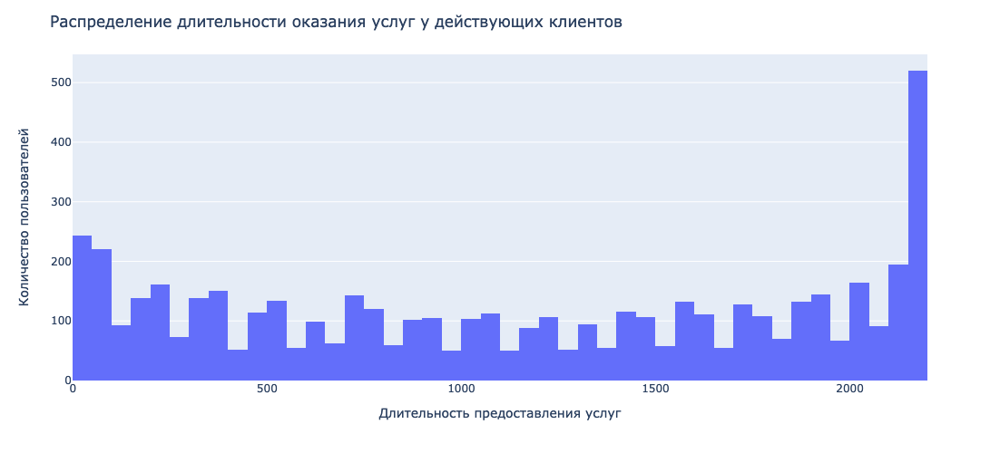

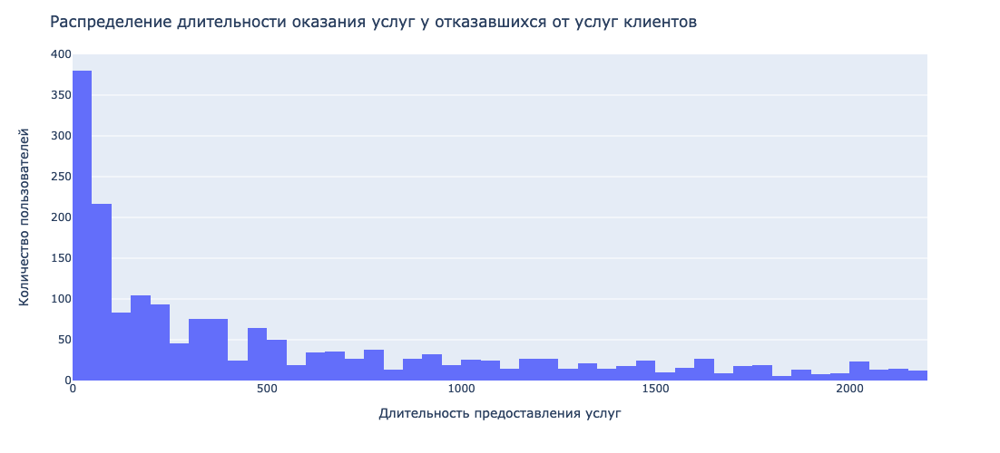

In [49]:
# построим график для действующих клиентов
hist1 = px.histogram(df_full[df_full['refusal']==0], x='days_of_service', nbins=100)
# зададим высоту графика и его название
hist1.update_layout({'title':'Распределение длительности оказания услуг у действующих клиентов'}, height=500)
# зададим название оси X
hist1.update_xaxes({'title':'Длительность предоставления услуг'})
# зададим название оси Y    
hist1.update_yaxes({'title':'Количество пользователей'})
hist1.show()

hist2 = px.histogram(df_full[df_full['refusal']==1], x='days_of_service', nbins=100)
# зададим высоту графика и его название
hist2.update_layout({'title':'Распределение длительности оказания услуг у отказавшихся от услуг клиентов'}, height=500)
# зададим название оси X
hist2.update_xaxes({'title':'Длительность предоставления услуг'})
# зададим название оси Y    
hist2.update_yaxes({'title':'Количество пользователей'})
hist2.show()

**Вывод:** видим зависимость количества дней от количества ушедших клиентов. То есть чем больше клиент пользуется услугами компании тем меньше вероятность его ухода. Большая часть клиентов (517 чел.) отказались от услуг в первые 100 дней

Рассмотрим зависимость оплаты в месяц от количества действующих и отказавшихся от услуг клиентов

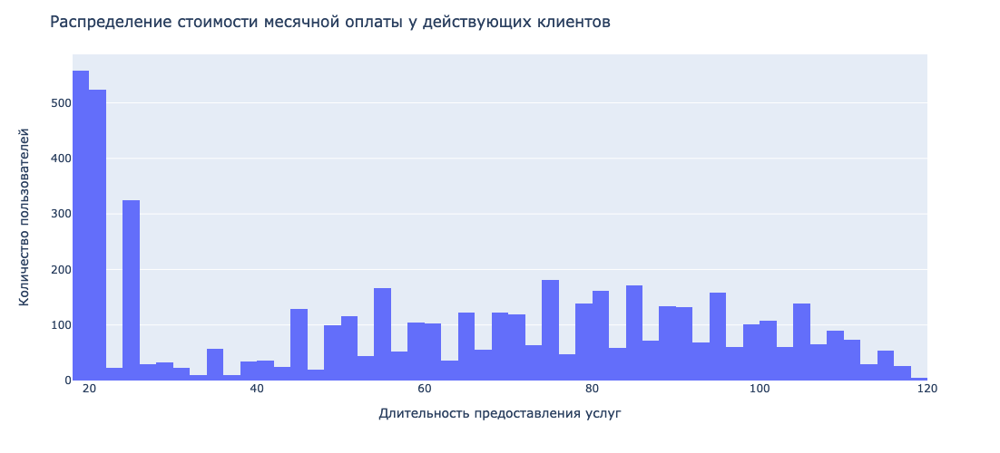

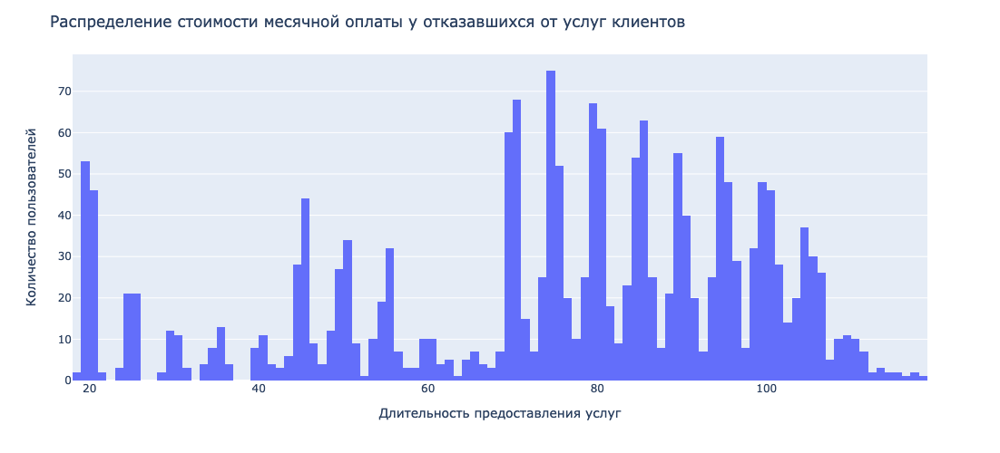

In [50]:
# построим график для действующих клиентов
hist1 = px.histogram(df_full[df_full['refusal']==0], x='monthly_charges', nbins=100)
# зададим высоту графика и его название
hist1.update_layout({'title':'Распределение стоимости месячной оплаты у действующих клиентов'}, height=500)
# зададим название оси X
hist1.update_xaxes({'title':'Длительность предоставления услуг'})
# зададим название оси Y    
hist1.update_yaxes({'title':'Количество пользователей'})
hist1.show()

hist2 = px.histogram(df_full[df_full['refusal']==1], x='monthly_charges', nbins=100)
# зададим высоту графика и его название
hist2.update_layout({'title':'Распределение стоимости месячной оплаты у отказавшихся от услуг клиентов'}, height=500)
# зададим название оси X
hist2.update_xaxes({'title':'Длительность предоставления услуг'})
# зададим название оси Y    
hist2.update_yaxes({'title':'Количество пользователей'})
hist2.show()

**Вывод:** видим, что чем выше стоимость оплаты в месяц, тем больше вероятность, что клиент откажеться от услуг. Значительная часть клиентов отказалсь от услуг при высокой стоимости в месяц. Действующие договора в основном распространяются на стоимость оплаты в месяц в диапазоне от 18 до 25

Рассмотрим зависимость типа оплаты услуг от количества отказавшихся от услуг клиентов

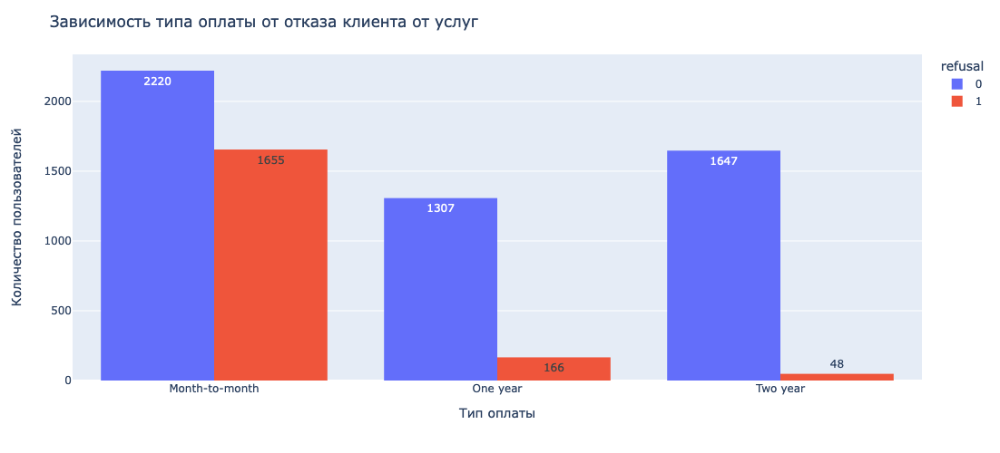

In [51]:
# построим график с помощью plotly
fig = px.histogram(df_full, x='type', y='refusal', color='refusal', histfunc='count',
                   barmode='group', text_auto=True)
# зададим высоту графика и его название
fig.update_layout({'title':'Зависимость типа оплаты от отказа клиента от услуг'}, height=500)
# зададим название оси X
fig.update_xaxes({'title':'Тип оплаты'})
# зададим название оси Y    
fig.update_yaxes({'title':'Количество пользователей'})
fig.show()

**Вывод:** логично, что значительная часть клиентов отказалась от услуг при типе договора `Month-to-month`. В наличии определенная зависимость отказа клиента от услуг от типа договора

Рассмотрим зависимость способа оплаты услуг от количества отказавшихся от услуг клиентов

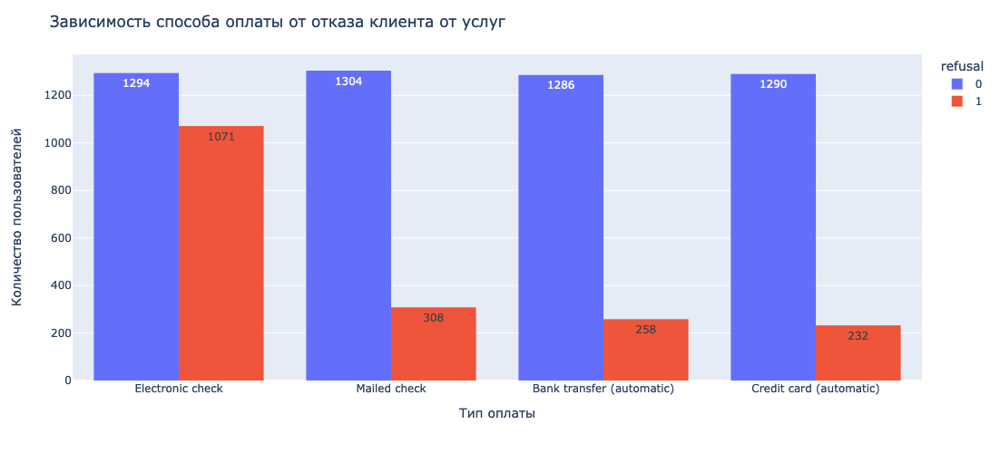

In [52]:
# построим график с помощью plotly
fig = px.histogram(df_full, x='payment_method', y='refusal', color='refusal', histfunc='count',
                   barmode='group', text_auto=True)
# зададим высоту графика и его название
fig.update_layout({'title':'Зависимость способа оплаты от отказа клиента от услуг'}, height=500)
# зададим название оси X
fig.update_xaxes({'title':'Тип оплаты'})
# зададим название оси Y    
fig.update_yaxes({'title':'Количество пользователей'})
fig.show()

**Вывод:** способ оплаты `Electronic check` возможно провоцирует отказ клиентов от услуг, т.к. на него приходится значительная часть ушедших клиентов (1071 чел.). Возможно стоит задуматься над расширением возможностей оповещения о других способах оплаты за услуги

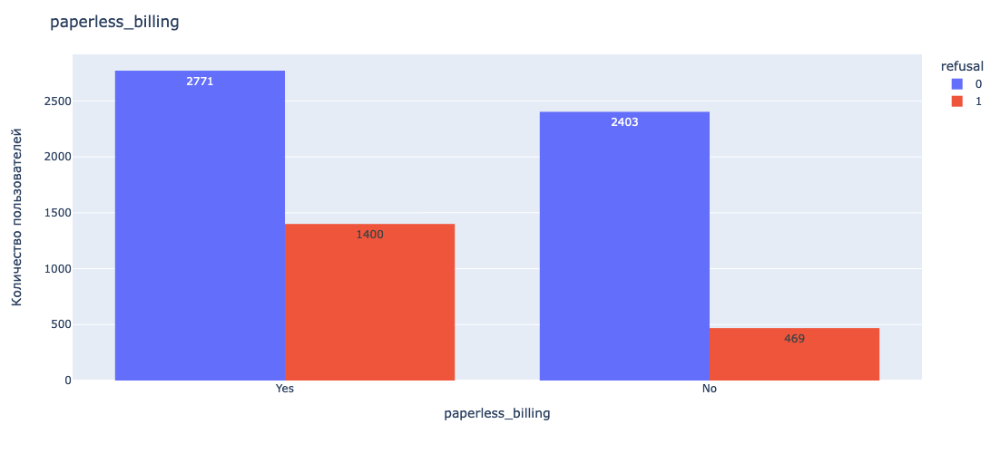

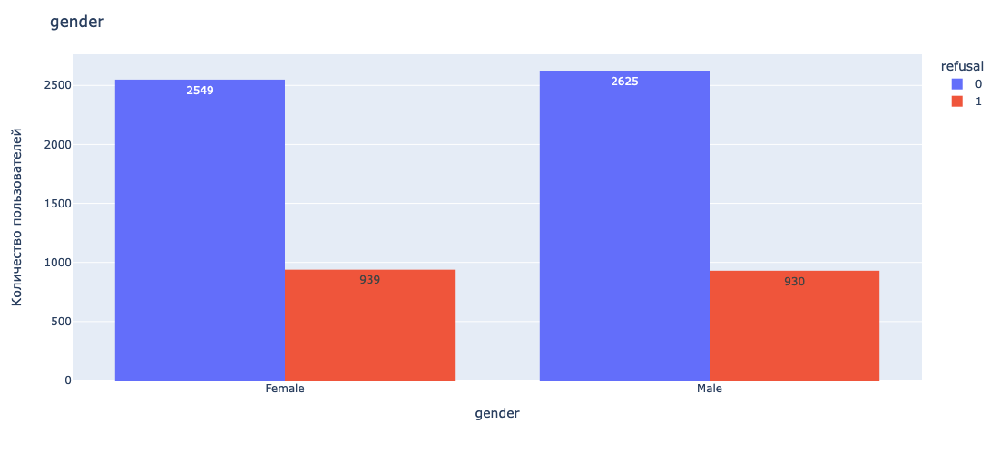

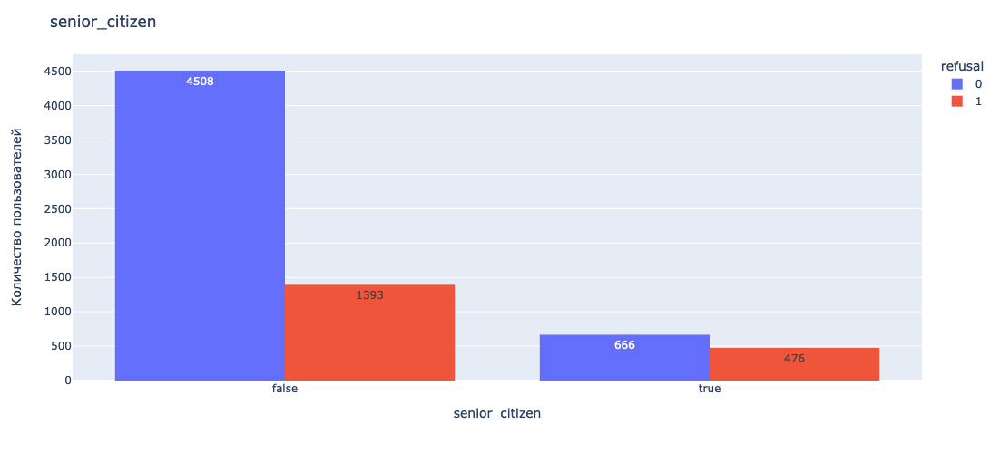

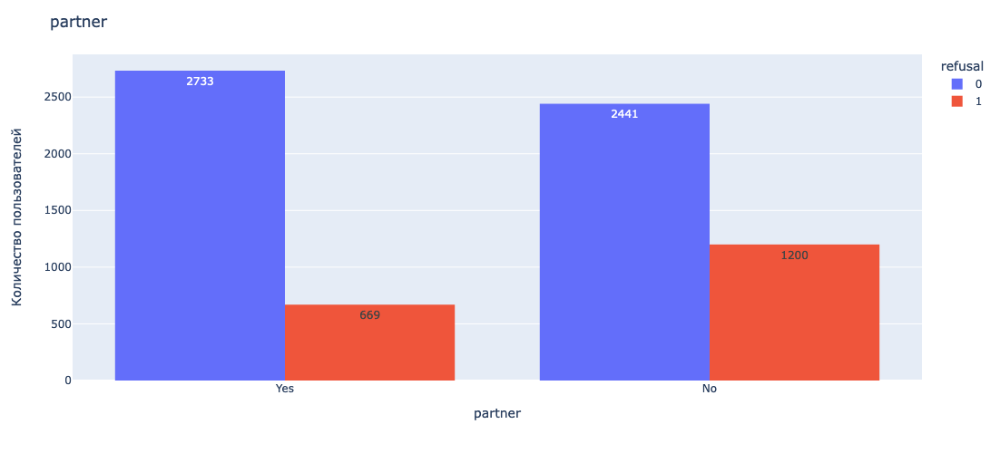

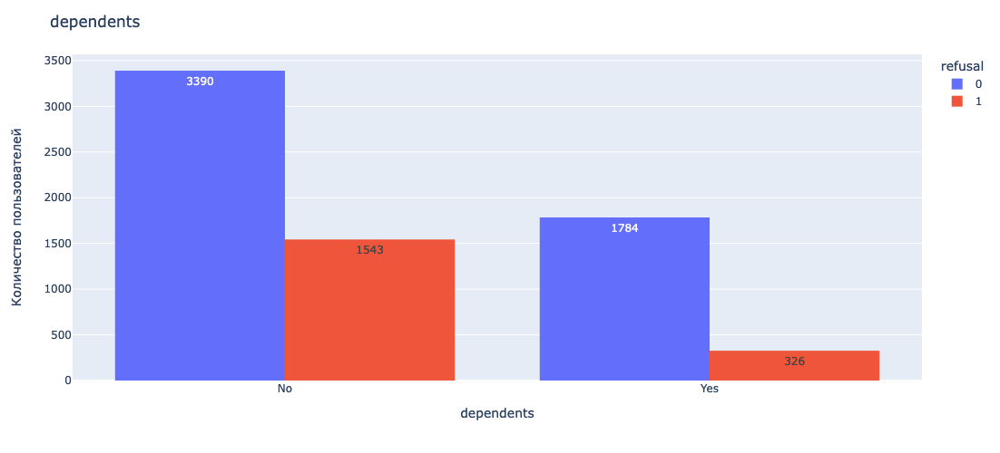

...

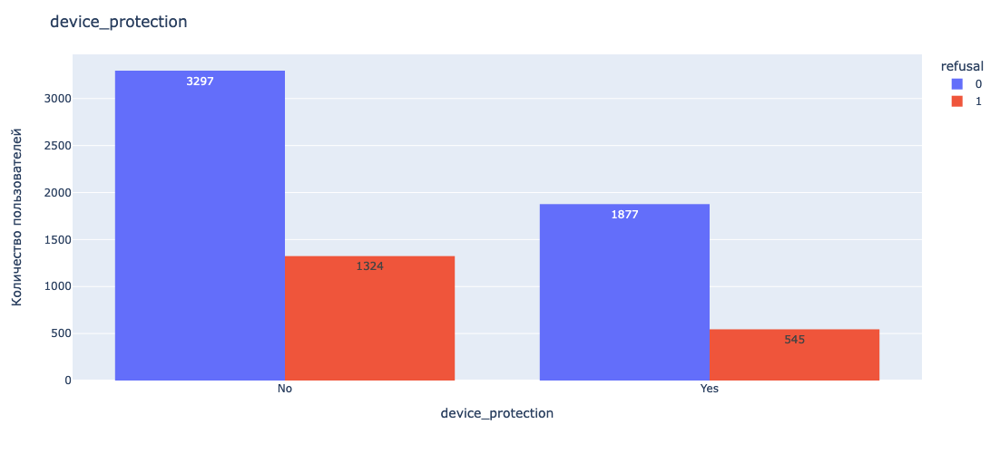

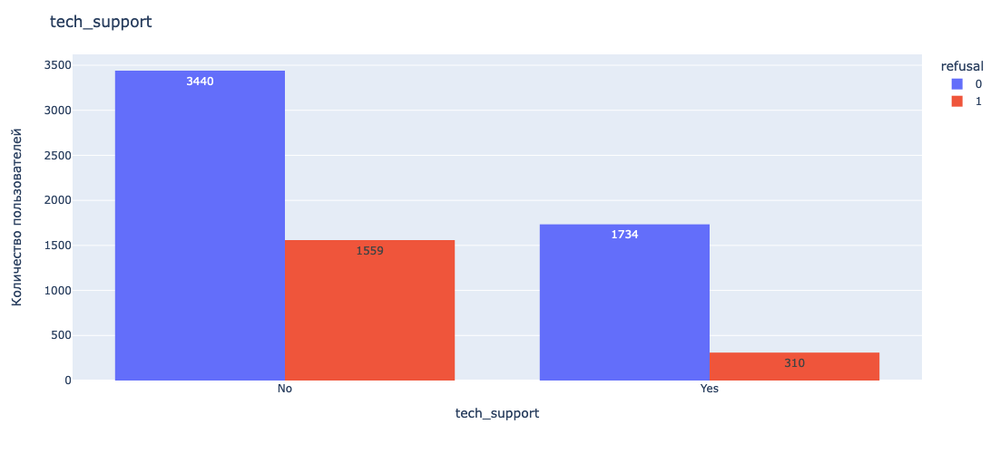

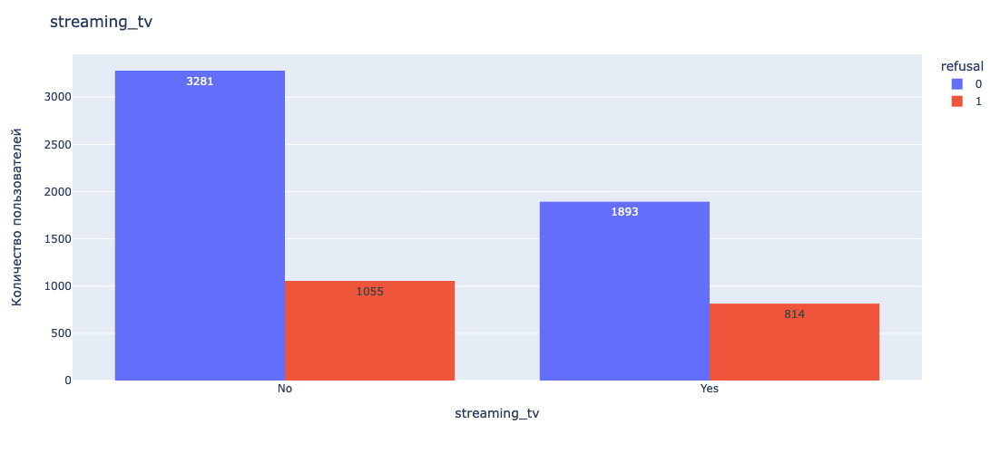

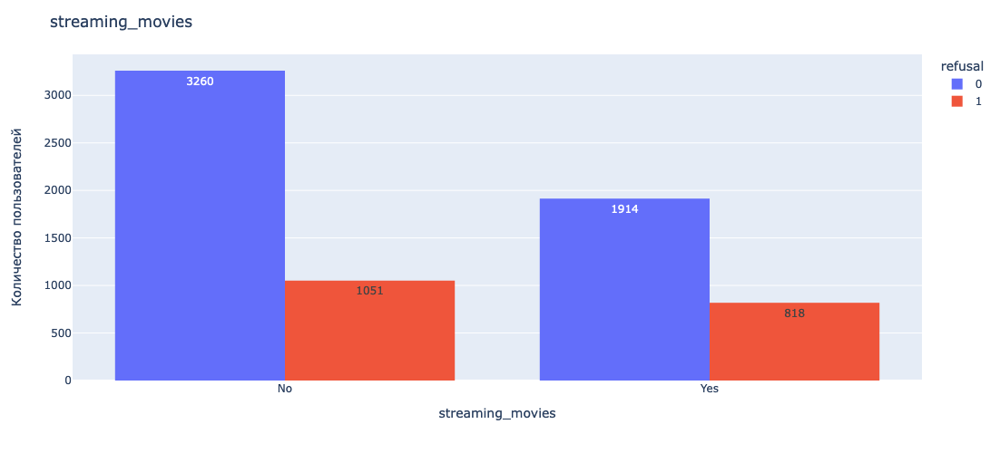

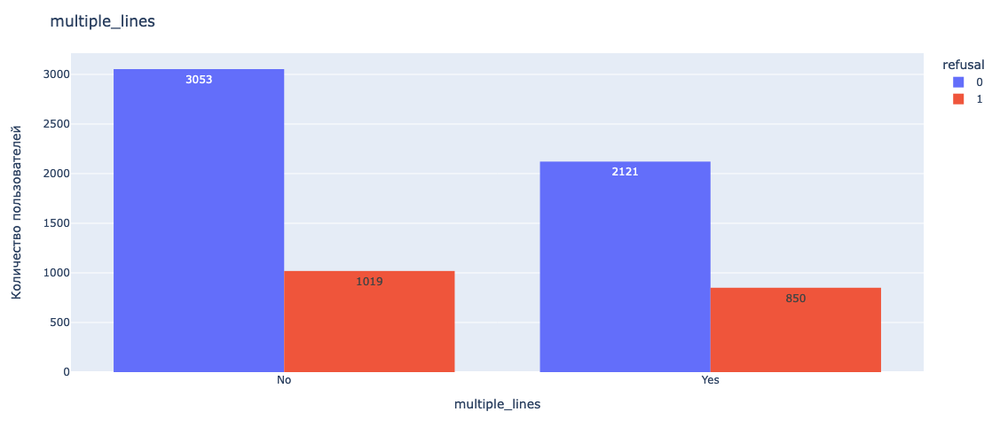

In [53]:
columns = ['paperless_billing', 'gender', 'senior_citizen', 'partner', 'dependents', 'internet_service', 'online_security', 'online_backup', 'device_protection', 'tech_support', 'streaming_tv', 'streaming_movies', 'multiple_lines']
for row in columns:
    # построим график с помощью plotly
    fig = px.histogram(df_full, x=row, y='refusal', color='refusal', histfunc='count',
                       barmode='group', text_auto=True)
    # зададим высоту графика и его название
    fig.update_layout({'title':row}, height=500)
    # зададим название оси Y    
    fig.update_yaxes({'title':'Количество пользователей'})
    fig.show()

**Вывод:** Рассмотрев все признаки можно сделать вывод, что кроме `gender` все остальные признаки имеют зависимость от возможного отказа клиента от услуг.

# План решения задачи

1. Подготовка данных для обучения модели, в рамках которого:
    - исследуем баланс классов
    - разделим данные на признаки и целевой признак      
    - разделим данные на выборки  
    - произведем масштабирование при необходимости
    - произведем кодирование признаков
    - кратко опишем выводы
2. Обучим разные модели, в рамках которого:
    - обучим разные модели с использованием библиотек scikit-learn, LightGBM, CatBoost
    - обучим модель с помощью RNN через библиотеку tensorflow
3. Проведем финальное тестирование, в рамках которого:
    - определим качество полученной модели на тестовой выборке
    - определим значимость признаков  
    - рассмотрим матрицу ошибок
4. Опишем выводы по проделланой работе

# Цель проекта

Построить модель, которая позволит определять клиентов, которые потенциально могут отказаться от услуг, в перспективе с возможностью определения мероприятий, предложений для таких клиентов

# Подготовка данных для обучения моделей

## Исследование баланса классов

Рассмотрим баланс целевого признака:

In [54]:
df_full

,today,customer_id,begin_date,end_date,type,paperless_billing,payment_method,monthly_charges,total_charges,gender,...,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,streaming_movies,multiple_lines,days_of_service,refusal
0,2020-02-01,7590-VHVEG,2020-01-01,2020-02-01,Month-to-month,Yes,Electronic check,29.85,29.85,Female,...,DSL,No,Yes,No,No,No,No,No,31,0
1,2020-02-01,5575-GNVDE,2017-04-01,2020-02-01,One year,No,Mailed check,56.95,1889.50,Male,...,DSL,Yes,No,Yes,No,No,No,No,1036,0
2,2020-02-01,3668-QPYBK,2019-10-01,2019-12-01,Month-to-month,Yes,Mailed check,53.85,108.15,Male,...,DSL,Yes,Yes,No,No,No,No,No,61,1
3,2020-02-01,7795-CFOCW,2016-05-01,2020-02-01,One year,No,Bank transfer (automatic),42.30,1840.75,Male,...,DSL,Yes,No,Yes,Yes,No,No,No,1371,0
4,2020-02-01,9237-HQITU,2019-09-01,2019-11-01,Month-to-month,Yes,Electronic check,70.70,151.65,Female,...,Fiber optic,No,No,No,No,No,No,No,61,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7038,2020-02-01,6840-RESVB,2018-02-01,2020-02-01,One year,Yes,Mailed check,84.80,1990.50,Male,...,DSL,Yes,No,Yes,Yes,Yes,Yes,Yes,730,0
7039,2020-02-01,2234-XADUH,2014-02-01,2020-02-01,One year,Yes,Credit card (automatic),103.20,7362.90,Female,...,Fiber optic,No,Yes,Yes,No,Yes,Yes,Yes,2191,0
7040,2020-02-01,4801-JZAZL,2019-03-01,2020-02-01,Month-to-month,Yes,Electronic check,29.60,346.45,Female,...,DSL,Yes,No,No,No,No,No,No,337,0
7041,2020-02-01,8361-LTMKD,2019-07-01,2019-11-01,Month-to-month,Yes,Mailed check,74.40,306.60,Male,...,Fiber optic,No,No,No,No,No,No,Yes,123,1


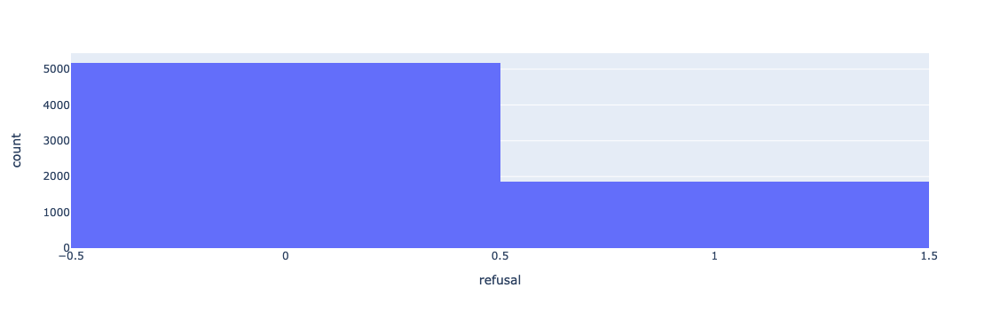

In [55]:
# посмотрим график для отражения баланса классов
hist = px.histogram(df_full, x='refusal', histfunc='count')
hist.show()

Как видим из графика 26% клиентов уходят из компании. Соответственно данные в целевом признаке не сбалансированы. Чуть позже устраним дисбаланс классов на обучающей выборке методом SMOTE

## Разделение данных

Выделим признаки и целевой признак и разделим на обучающую и тестовую выборки в соотношении 3:1

In [56]:
# выделим признаки и целевой признак
target = df_full['refusal']
features = df_full.drop(['refusal', 'customer_id', 'begin_date', 'gender', 'end_date','today'], axis=1)
# разделим данные на тестовую и обучающую выборки
features_train, features_test, target_train, target_test = train_test_split(features, target, test_size=0.25, random_state=RANDOM_STATE)

In [57]:
# рассмотрим информацию о данных
features_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5282 entries, 3792 to 5629
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               5282 non-null   object 
 1   paperless_billing  5282 non-null   object 
 2   payment_method     5282 non-null   object 
 3   monthly_charges    5282 non-null   float64
 4   total_charges      5282 non-null   float64
 5   senior_citizen     5282 non-null   bool   
 6   partner            5282 non-null   object 
 7   dependents         5282 non-null   object 
 8   internet_service   5282 non-null   object 
 9   online_security    5282 non-null   object 
 10  online_backup      5282 non-null   object 
 11  device_protection  5282 non-null   object 
 12  tech_support       5282 non-null   object 
 13  streaming_tv       5282 non-null   object 
 14  streaming_movies   5282 non-null   object 
 15  multiple_lines     5282 non-null   object 
 16  days_of_service    52

In [58]:
# рассмотрим информацию о данных
features_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1761 entries, 6199 to 2215
Data columns (total 17 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               1761 non-null   object 
 1   paperless_billing  1761 non-null   object 
 2   payment_method     1761 non-null   object 
 3   monthly_charges    1761 non-null   float64
 4   total_charges      1761 non-null   float64
 5   senior_citizen     1761 non-null   bool   
 6   partner            1761 non-null   object 
 7   dependents         1761 non-null   object 
 8   internet_service   1761 non-null   object 
 9   online_security    1761 non-null   object 
 10  online_backup      1761 non-null   object 
 11  device_protection  1761 non-null   object 
 12  tech_support       1761 non-null   object 
 13  streaming_tv       1761 non-null   object 
 14  streaming_movies   1761 non-null   object 
 15  multiple_lines     1761 non-null   object 
 16  days_of_service    17

## Кодирование признаков и устранение дисбаланса

В целях снижения рисков появления утечек данных, отдельно закодируем обучающую и тестовую выборки

In [59]:
# создаем список категориальных колонок cat_columns и числовых numeric
cat_columns = ['type', 'paperless_billing', 'payment_method', 'senior_citizen', 'partner', 'dependents',\
              'internet_service', 'online_security', 'online_backup', 'device_protection', 'tech_support',\
               'streaming_tv', 'multiple_lines']
numeric = ['monthly_charges', 'total_charges', 'days_of_service']

In [60]:
# создадим метод OrdinalEncoder для кодирования
ordinal = OrdinalEncoder()
ordinal.fit(features_train[cat_columns])
# создаем обучающую выборку с закодированными данными
features_train_ord = pd.DataFrame(ordinal.transform(features_train[cat_columns]), 
                            columns = cat_columns, index = features_train.index)
# объединяем таблицы
features_train_ord = features_train_ord.join(features_train[numeric]) 

In [61]:
# рассмотрим данные после кодирования
features_train_ord

,type,paperless_billing,payment_method,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,multiple_lines,monthly_charges,total_charges,days_of_service
3792,0.0,1.0,2.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,91.25,2351.80,791
4005,0.0,1.0,3.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,1.0,24.05,24.05,31
1766,1.0,1.0,3.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,20.55,583.30,822
210,0.0,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,46.00,84.50,61
3419,2.0,1.0,3.0,0.0,1.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,0.0,92.15,6480.90,2102
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3267,1.0,0.0,3.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,20.05,951.55,1432
5918,2.0,0.0,3.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,19.50,1147.85,1798
6389,2.0,0.0,1.0,0.0,1.0,1.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,19.55,1079.65,1767
3352,0.0,1.0,3.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,85.45,85.45,31


In [62]:
# рассмотрим информацию о данных
features_train_ord.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 5282 entries, 3792 to 5629
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               5282 non-null   float64
 1   paperless_billing  5282 non-null   float64
 2   payment_method     5282 non-null   float64
 3   senior_citizen     5282 non-null   float64
 4   partner            5282 non-null   float64
 5   dependents         5282 non-null   float64
 6   internet_service   5282 non-null   float64
 7   online_security    5282 non-null   float64
 8   online_backup      5282 non-null   float64
 9   device_protection  5282 non-null   float64
 10  tech_support       5282 non-null   float64
 11  streaming_tv       5282 non-null   float64
 12  multiple_lines     5282 non-null   float64
 13  monthly_charges    5282 non-null   float64
 14  total_charges      5282 non-null   float64
 15  days_of_service    5282 non-null   int64  
dtypes: float64(15), int64

In [63]:
# создаем тестовую выборку с закодированными данными
features_test_ord = pd.DataFrame(ordinal.transform(features_test[cat_columns]), 
                            columns = cat_columns, index = features_test.index)
# объединяем таблицы
features_test_ord = features_test_ord.join(features_test[numeric]) 

In [64]:
# рассмотрим данные после кодирования
features_test_ord

,type,paperless_billing,payment_method,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,multiple_lines,monthly_charges,total_charges,days_of_service
6199,0.0,1.0,3.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0,89.55,3856.75,1309
3521,1.0,0.0,2.0,0.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,0.0,53.45,3053.00,1737
5344,2.0,1.0,1.0,0.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,76.90,5522.70,2163
6795,0.0,1.0,2.0,0.0,1.0,1.0,1.0,1.0,1.0,0.0,0.0,0.0,1.0,85.10,4600.95,1676
3168,1.0,1.0,3.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,19.35,1033.00,1523
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
839,2.0,0.0,1.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,20.40,905.55,1340
4617,0.0,1.0,0.0,0.0,0.0,0.0,2.0,0.0,0.0,0.0,0.0,0.0,0.0,20.70,39.85,62
7038,1.0,1.0,3.0,0.0,1.0,1.0,0.0,1.0,0.0,1.0,1.0,1.0,1.0,84.80,1990.50,730
2844,0.0,1.0,2.0,1.0,1.0,0.0,1.0,1.0,0.0,0.0,0.0,1.0,1.0,99.60,347.65,122


In [65]:
# рассмотрим информацию о данных
features_test_ord.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1761 entries, 6199 to 2215
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   type               1761 non-null   float64
 1   paperless_billing  1761 non-null   float64
 2   payment_method     1761 non-null   float64
 3   senior_citizen     1761 non-null   float64
 4   partner            1761 non-null   float64
 5   dependents         1761 non-null   float64
 6   internet_service   1761 non-null   float64
 7   online_security    1761 non-null   float64
 8   online_backup      1761 non-null   float64
 9   device_protection  1761 non-null   float64
 10  tech_support       1761 non-null   float64
 11  streaming_tv       1761 non-null   float64
 12  multiple_lines     1761 non-null   float64
 13  monthly_charges    1761 non-null   float64
 14  total_charges      1761 non-null   float64
 15  days_of_service    1761 non-null   int64  
dtypes: float64(15), int64

Также скорректируем тип данных целевых выборок

In [66]:
# поменяем тип данных на выборках с целвыми признаками
target_train = target_train.astype(int)
target_test = target_test.astype(int)

Теперь для повышения качества обучения моделей устраним дисбаласн классов с помощью метода SMOTE

In [67]:
# устраним дисбаланс с помощью метода SMOTE
sm = SMOTE(random_state = RANDOM_STATE)
features_train_ord_res, target_train_res = sm.fit_resample(features_train_ord, target_train.ravel())

In [68]:
# посмотрим на количетсво 0 и 1
print("Количество '1': {}".format(sum(target_train_res == 1)))
print("Количество '0': {}".format(sum(target_train_res == 0)))

Количество '1': 3867
Количество '0': 3867


Дисбаланс классов устранен, теперь у каждого класса по 3904 объекта

## Масштабирование признаков

Теперь для линейныйх моделей сделаем отдельно масштабирование

In [69]:
# произведем масштабирование 
scaler = StandardScaler()
features_train_ord_res_sc = features_train_ord_res
scaler.fit(features_train_ord_res_sc[numeric])
features_train_ord_res_sc[numeric] = scaler.transform(features_train_ord_res_sc[numeric])

In [70]:
# рассмотрим полученную выборку
features_train_ord_res_sc

,type,paperless_billing,payment_method,senior_citizen,partner,dependents,internet_service,online_security,online_backup,device_protection,tech_support,streaming_tv,multiple_lines,monthly_charges,total_charges,days_of_service
0,0.000000,1.0,2.000000,1.000000,0.000000,0.0,1.0,0.000000,0.0,0.000000,0.0,1.0,0.000000,0.815472,0.148756,-0.067600
1,0.000000,1.0,3.000000,0.000000,0.000000,0.0,2.0,0.000000,0.0,0.000000,0.0,0.0,1.000000,-1.523846,-0.925095,-1.109775
2,1.000000,1.0,3.000000,0.000000,1.000000,1.0,2.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,-1.645686,-0.667098,-0.025090
3,0.000000,1.0,1.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,-0.759739,-0.897207,-1.068636
4,2.000000,1.0,3.000000,0.000000,1.000000,1.0,1.0,0.000000,1.0,0.000000,1.0,1.0,0.000000,0.846802,2.053615,1.730151
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7729,0.000000,1.0,3.000000,0.000000,0.000000,0.0,2.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,-1.670321,-0.927036,-1.111146
7730,0.075507,1.0,2.000000,0.924493,0.000000,0.0,1.0,0.075507,0.0,0.075507,1.0,1.0,0.924493,1.093892,0.785073,0.435661
7731,0.000000,0.0,2.773648,0.000000,0.000000,0.0,2.0,0.000000,0.0,0.000000,0.0,0.0,0.000000,-1.665226,-0.926968,-1.109775
7732,0.000000,1.0,3.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.514752,0.0,0.0,0.485248,-0.610741,-0.912994,-1.111146


## Выводы

По результатам подготовки данных перед обучением произвели:
- выполнили исследование классов. Дисбаланс классов составил в соотношении 3:1.
- выполнили разделение датасета на признаки и целевой признак и выделили обучающую и тестовую выборки в соотношении 3:1
- произвели порядковое кодирование выборок и изменили тип данных на целевом признаке
- устранили дисбаланс методом SMOTE
- выполнили масштабирование признаков для линейных моделей

# Обучение моделей

## Модель логистической регрессии

Рассмотрение моделей начнем с модели **логистической регрессии**

In [69]:
%%time
# обучим модель случаного леса
lrc = LogisticRegression(random_state = RANDOM_STATE)
# определим диапазон гиперпараметров
param_dist = [{'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']},
              {'C':[0.001, 0.01, 0.1, 1, 10, 100]},
              {'fit_intercept':[True, False]}]
# определим лучшие параметры с помощью RandomizedSearchCV
model_lr = GridSearchCV(lrc, param_dist, cv = 4, scoring = 'roc_auc')
# обучим модельна обучающей выборке
model_lr.fit(features_train_ord_res_sc, target_train_res)
# отобразим лучшие параметры
model_lr.best_params_

CPU times: user 7.61 s, sys: 460 ms, total: 8.07 s
Wall time: 856 ms


{'fit_intercept': False}

In [70]:
# среднее значение ROC-AUC по разным выборкам
print('Наибольший показатель ROC-AUC:', model_lr.best_score_)

Наибольший показатель ROC-AUC: 0.8496117173550028


## Модель дерева решений

Рассмотрим модели **дерева решений**. Для этого используем функцию GridSearchCV для поиска лучших параметров

In [71]:
%%time
# обучим модель с деревом решений
dfc = DecisionTreeClassifier(random_state = RANDOM_STATE)
# пропишем диапазоны параметров для поиска лучших
max_features = ['log2', 'sqrt']
max_depth = [int(x) for x in np.linspace(start = 1, stop = 30, num = 10)]
min_samples_split = [int(x) for x in np.linspace(start = 2, stop = 100, num = 10)]
min_samples_leaf = [int(x) for x in np.linspace(start = 2, stop = 100, num = 10)]
param_dist = {'max_features': max_features,
          'max_depth': max_depth,
          'min_samples_split': min_samples_split,
          'min_samples_leaf': min_samples_leaf,}
# определим лучшие параметры через GridSearchCV
model_dfc = GridSearchCV(dfc, 
                     param_dist, 
                     cv = 4, 
                     scoring = 'roc_auc')                
# обучим модель на обучающей выборке
model_dfc.fit(features_train_ord, target_train)
# отобразим полученные параметры
model_dfc.best_params_

CPU times: user 25.4 s, sys: 323 ms, total: 25.7 s
Wall time: 25.7 s


{'max_depth': 10,
 'max_features': 'log2',
 'min_samples_leaf': 45,
 'min_samples_split': 100}

In [72]:
# среднее значение ROC-AUC по разным выборкам
print('Наибольший показатель ROC-AUC:','{:.3f}'.format(model_dfc.best_score_))

Наибольший показатель ROC-AUC: 0.836


## Модель случайного леса

Теперь перейдем к модели **случайного леса**. Применим метод RandomizedSearchCV для RandomForestClassifier для определния оптимальных параметров модели. И проверим лучшие параметры отобразив значение параметра ROC-AUC

In [73]:
%%time
# обучим модель случаного леса
rfc = RandomForestClassifier(random_state = RANDOM_STATE)
# определим диапазон гиперпараметров
n_estimators = [int(x) for x in np.linspace(start = 10, stop = 1000, num = 10)]
max_features = ['log2', 'sqrt']
max_depth = [int(x) for x in np.linspace(start = 1, stop = 30, num = 15)]
min_samples_split = [int(x) for x in np.linspace(start = 2, stop = 100, num = 10)]
min_samples_leaf = [int(x) for x in np.linspace(start = 2, stop = 100, num = 10)]
bootstrap = [True, False]
param_dist = {'n_estimators': n_estimators,
              'max_features': max_features,
              'max_depth': max_depth,
              'min_samples_split': min_samples_split,
              'min_samples_leaf': min_samples_leaf,
              'bootstrap': bootstrap}
# определим лучшие параметры с помощью RandomizedSearchCV
model_rfc = RandomizedSearchCV(rfc, 
                               param_dist, 
                               cv = 4, 
                               scoring = 'roc_auc')                
# обучим модельна обучающей выборке
model_rfc.fit(features_train_ord, target_train)
# отобразим лучшие параметры
model_rfc.best_params_

CPU times: user 45 s, sys: 211 ms, total: 45.2 s
Wall time: 45.2 s


{'n_estimators': 1000,
 'min_samples_split': 45,
 'min_samples_leaf': 34,
 'max_features': 'log2',
 'max_depth': 30,
 'bootstrap': False}

In [74]:
# среднее значение ROC-AUC по разным выборкам
print('Наибольший показатель ROC-AUC:','{:.3f}'.format(model_rfc.best_score_))

Наибольший показатель ROC-AUC: 0.863


## Дерево принятия решений с градиентным бустингом

Используем модель дерева принятия решений с градиентным бустингом (gbdt: traditional Gradient Boosting Decision Tree). 

In [98]:
%%time
# с помощью GridSearchCV подберем параметры для модели
# создадим модель gbdt
lgb_model_gbdt = lgb.LGBMClassifier(random_state = RANDOM_STATE)
# определим параметры 
parameters = {
    'task' : ['train'],
    'boosting_type': ['gbdt'],
    'objective': ['binary'],
    'num_iterations': [1500, 2500],
    'learning_rate':[0.1, 0.05],
    'num_leaves':[60, 80],
    'max_depth' :[10, 15],
    'min_child_samples':[15, 25],
    'metric': ['roc_auc']
     }
gsearch_gbdt = GridSearchCV(lgb_model_gbdt, param_grid = parameters, cv=4, scoring='roc_auc') 
# обучим модель
gsearch_gbdt.fit(features_train_ord,target_train) 

CPU times: total: 1h 51min 52s
Wall time: 4min 52s


GridSearchCV(cv=4,
             estimator=LGBMClassifier(random_state=RandomState(MT19937) at 0x20CA3870E40),
             param_grid={'boosting_type': ['gbdt'],
                         'learning_rate': [0.1, 0.05], 'max_depth': [10, 15],
                         'metric': ['roc_auc'], 'min_child_samples': [15, 25],
                         'num_iterations': [1500, 2500], 'num_leaves': [60, 80],
                         'objective': ['binary'], 'task': ['train']},
             scoring='roc_auc')

In [99]:
# посмотрим подобранные параметры 
print('best params')
print(gsearch_gbdt.best_params_)

best params
{'boosting_type': 'gbdt', 'learning_rate': 0.05, 'max_depth': 10, 'metric': 'roc_auc', 'min_child_samples': 15, 'num_iterations': 1500, 'num_leaves': 60, 'objective': 'binary', 'task': 'train'}


In [102]:
# среднее значение ROC-AUC по разным выборкам
print('Наибольший показатель ROC-AUC:','{:.3f}'.format(gsearch_gbdt.best_score_))

Наибольший показатель ROC-AUC: 0.887


## Модель односторонней выборки на основе градиента GOSS

Используем модель односторонней выборки на основе градиента GOSS

In [108]:
%%time
# с помощью GridSearchCV подберем параметры для модели
# создадим модель goss
lgb_model_goss = lgb.LGBMClassifier(random_state = RANDOM_STATE)
# определим параметры 
parameters = {
    'task' : ['train'],
    'boosting_type': ['goss'],
    'objective': ['binary'],
    'num_iterations': [1500, 2500],
    'learning_rate':[0.1, 0.05],
    'num_leaves':[15, 30],
    'max_depth' :[10, 15],
    'min_child_samples':[15, 25],
    'metric': ['roc_auc']
     }
gsearch_goss = GridSearchCV(lgb_model_goss, param_grid = parameters, cv=4, scoring='roc_auc') 
# обучим модель
gsearch_goss.fit(features_train_ord, target_train) 

CPU times: total: 1h 5min 23s
Wall time: 2min 51s


GridSearchCV(cv=4,
             estimator=LGBMClassifier(random_state=RandomState(MT19937) at 0x20CA3870E40),
             param_grid={'boosting_type': ['goss'],
                         'learning_rate': [0.1, 0.05], 'max_depth': [10, 15],
                         'metric': ['roc_auc'], 'min_child_samples': [15, 25],
                         'num_iterations': [1500, 2500], 'num_leaves': [15, 30],
                         'objective': ['binary'], 'task': ['train']},
             scoring='roc_auc')

In [112]:
# посмотрим подобранные параметры 
print('best params')
print(gsearch_goss.best_params_)

best params
{'boosting_type': 'goss', 'learning_rate': 0.05, 'max_depth': 15, 'metric': 'roc_auc', 'min_child_samples': 15, 'num_iterations': 1500, 'num_leaves': 15, 'objective': 'binary', 'task': 'train'}


In [110]:
# среднее значение ROC-AUC по разным выборкам
print('Наибольший показатель ROC-AUC:','{:.3f}'.format(gsearch_goss.best_score_))

Наибольший показатель ROC-AUC: 0.883


## Обучение модели TensorFlow

Обучим модель с помощью RNN через библиотеку tensorflow

In [75]:
# подготовим данные
features_train_tf = features_train_ord.values.reshape((5282,1,16))
target_train_tf = target_train.values.reshape((5282,1))
x_train, x_valid, y_train, y_valid = train_test_split(features_train_tf,target_train_tf, test_size=0.25, shuffle= True)

In [76]:
# создадим модель
model_tf = Sequential()

# добавим слои LSTM
model_tf.add(LSTM(10,input_shape=(1,16),return_sequences = True,activation='relu'))
model_tf.add(Dropout(0.1))
model_tf.add(LSTM(5,input_shape=(1,16),activation='relu'))
model_tf.add(Dropout(0.1))
model_tf.add(Dense(units=1, activation='sigmoid'))
# посмотрим информацию о модели
model_tf.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm (LSTM)                 (None, 1, 10)             1080      
                                                                 
 dropout (Dropout)           (None, 1, 10)             0         
                                                                 
 lstm_1 (LSTM)               (None, 5)                 320       
                                                                 
 dropout_1 (Dropout)         (None, 5)                 0         
                                                                 
 dense (Dense)               (None, 1)                 6         
                                                                 
Total params: 1,406
Trainable params: 1,406
Non-trainable params: 0
_________________________________________________________________


In [81]:
# скомпилируем и обучим модель
model_tf.compile(loss = 'binary_crossentropy', optimizer='adam',metrics = ['AUC'])
model_tf.fit(x_train,y_train,epochs=30,validation_data=(x_valid,y_valid),batch_size=64)

Epoch 1/30
62/62 [==============================] - 1s 4ms/step - loss: 0.4602 - auc: 0.8001 - val_loss: 0.4423 - val_auc: 0.8310
Epoch 2/30
62/62 [==============================] - 0s 1ms/step - loss: 0.4551 - auc: 0.8008 - val_loss: 0.4305 - val_auc: 0.8349
Epoch 3/30
62/62 [==============================] - 0s 1ms/step - loss: 0.4571 - auc: 0.8023 - val_loss: 0.4250 - val_auc: 0.8354
Epoch 4/30
62/62 [==============================] - 0s 1ms/step - loss: 0.4576 - auc: 0.7983 - val_loss: 0.4327 - val_auc: 0.8331
Epoch 5/30
62/62 [==============================] - 0s 1ms/step - loss: 0.4528 - auc: 0.8066 - val_loss: 0.4311 - val_auc: 0.8317
Epoch 6/30
62/62 [==============================] - 0s 1ms/step - loss: 0.4551 - auc: 0.8013 - val_loss: 0.4286 - val_auc: 0.8356
Epoch 7/30
62/62 [==============================] - 0s 1ms/step - loss: 0.4516 - auc: 0.8039 - val_loss: 0.4459 - val_auc: 0.8357
Epoch 8/30
62/62 [==============================] - 0s 1ms/step - loss: 0.5036 - auc: 0.78

Наибольший показатель ROC-AUC получили 0.824

## Модель градиетного бустинга CatBoost

Последней рассмотрим модель градиетного бустинга из библиотеки CatBoost

In [82]:
%%time
# с помощью GridSearchCV подберем параметры для модели
# создадим модель CatBoost
cbc_model = CatBoostClassifier()
# определим параметры 
parameters = {
    'learning_rate':[0.01, 0.03],
    'l2_leaf_reg': [3, 6],
    'depth' :[5, 8],
    'min_child_samples':[15, 25],
    'eval_metric' : ['AUC'],
    'random_state' : [27022023]
     }
gsearch_cbc = GridSearchCV(cbc_model, param_grid = parameters, cv=4, scoring='roc_auc') 
# обучим модель
gsearch_cbc.fit(features_train_ord, target_train) 

0:	total: 63.8ms	remaining: 1m 3s
1:	total: 65.9ms	remaining: 32.9s
2:	total: 67.9ms	remaining: 22.6s
3:	total: 70ms	remaining: 17.4s
4:	total: 71.9ms	remaining: 14.3s
5:	total: 73.9ms	remaining: 12.2s
6:	total: 76.1ms	remaining: 10.8s
7:	total: 78.2ms	remaining: 9.7s
8:	total: 80.2ms	remaining: 8.83s
9:	total: 82.4ms	remaining: 8.16s
10:	total: 84.4ms	remaining: 7.58s
11:	total: 86.6ms	remaining: 7.13s
12:	total: 88.6ms	remaining: 6.73s
13:	total: 91.3ms	remaining: 6.43s
14:	total: 93.5ms	remaining: 6.14s
15:	total: 95.7ms	remaining: 5.89s
16:	total: 97.7ms	remaining: 5.65s
17:	total: 99.5ms	remaining: 5.42s
18:	total: 101ms	remaining: 5.23s
19:	total: 103ms	remaining: 5.06s
20:	total: 105ms	remaining: 4.9s
21:	total: 107ms	remaining: 4.77s
22:	total: 109ms	remaining: 4.64s
23:	total: 111ms	remaining: 4.5s
24:	total: 112ms	remaining: 4.38s
25:	total: 114ms	remaining: 4.27s
26:	total: 115ms	remaining: 4.16s
27:	total: 117ms	remaining: 4.05s
28:	total: 118ms	remaining: 3.94s
29:	total: 

GridSearchCV(cv=4,
             estimator=<catboost.core.CatBoostClassifier object at 0x2d8559fc0>,
             param_grid={'depth': [5, 8], 'eval_metric': ['AUC'],
                         'l2_leaf_reg': [3, 6], 'learning_rate': [0.01, 0.03],
                         'min_child_samples': [15, 25],
                         'random_state': [27022023]},
             scoring='roc_auc')

In [83]:
# посмотрим подобранные параметры 
print('best params')
print(gsearch_cbc.best_params_)

best params
{'depth': 5, 'eval_metric': 'AUC', 'l2_leaf_reg': 3, 'learning_rate': 0.03, 'min_child_samples': 15, 'random_state': 27022023}


In [84]:
# среднее значение ROC-AUC по разным выборкам
print('Наибольший показатель ROC-AUC:','{:.3f}'.format(gsearch_cbc.best_score_))

Наибольший показатель ROC-AUC: 0.905


# Проверка лучшей модели на тестовой выборке

Проведем финальное тестирование, в рамках которого:
- определим качество полученной модели на тестовой выборке
- определим значимость признаков  
- рассмотрим матрицу ошибок

Наибольший показатель ROC-AUC получили на модели CatBoostClassifier - 0,905. Для которой были подобраны следущие параметры:
- 'depth': 5
- 'l2_leaf_reg': 3 
- 'learning_rate': 0.03
- 'min_child_samples': 15
- 'random_state': 27022023

Проверим эту модель на тестовой выборке

In [85]:
probabilities_valid = gsearch_cbc.predict_proba(features_test_ord)
probabilities_one_valid = probabilities_valid[:, 1]
auc_roc = roc_auc_score(target_test,probabilities_one_valid)   
pred=gsearch_cbc.predict(features_test_ord)
print('accuracy:','{:.3f}'.format(accuracy_score(target_test,pred)))
print('roc_auc:','{:.3f}'.format(auc_roc))
print('Полнота:','{:.3f}'.format(recall_score(target_test,pred)))
print('Точность:','{:.3f}'.format(precision_score(target_test,pred)))

accuracy: 0.852
roc_auc: 0.895
Полнота: 0.597
Точность: 0.777


Как видим целевой показатель ROC-AUC достигнут до показателя: 0,894

Посмотрим таблицу матрицы ошибок:

In [86]:
# построим матрицу ошибок
confusion_matrix(target_test, pred)

array([[1229,   78],
       [ 183,  271]])

По матрице ошибок можно сказать, что доля правильных ответов составила 82,6%, при этом показатель Recall составляет - 0,87, а показатель Precision - 0,93

Далее построим диаграмму важности признаков лучшей модели

In [87]:
# обучим модель с подобранными гиперпараметрами
model_cbc = CatBoostClassifier(
    depth=5,
    l2_leaf_reg=3,
    learning_rate=0.03,
    min_child_samples=15,
    random_state=27022023
)
model_cbc.fit(features_train_ord, target_train)

0:	learn: 0.6741550	total: 2.85ms	remaining: 2.85s
1:	learn: 0.6550971	total: 5.44ms	remaining: 2.71s
2:	learn: 0.6365403	total: 7.35ms	remaining: 2.44s
3:	learn: 0.6214579	total: 9.27ms	remaining: 2.31s
4:	learn: 0.6073960	total: 11.3ms	remaining: 2.25s
5:	learn: 0.5933646	total: 13.1ms	remaining: 2.17s
6:	learn: 0.5804297	total: 15.4ms	remaining: 2.18s
7:	learn: 0.5691278	total: 17.7ms	remaining: 2.19s
8:	learn: 0.5571880	total: 19.9ms	remaining: 2.19s
9:	learn: 0.5488860	total: 21.9ms	remaining: 2.16s
10:	learn: 0.5396610	total: 23.5ms	remaining: 2.12s
11:	learn: 0.5305831	total: 25.2ms	remaining: 2.08s
12:	learn: 0.5235461	total: 27.1ms	remaining: 2.06s
13:	learn: 0.5152444	total: 28.8ms	remaining: 2.02s
14:	learn: 0.5074394	total: 30.8ms	remaining: 2.02s
15:	learn: 0.4987831	total: 33.3ms	remaining: 2.05s
16:	learn: 0.4929747	total: 35ms	remaining: 2.02s
17:	learn: 0.4870980	total: 37ms	remaining: 2.02s
18:	learn: 0.4816482	total: 38.9ms	remaining: 2.01s
19:	learn: 0.4770729	total

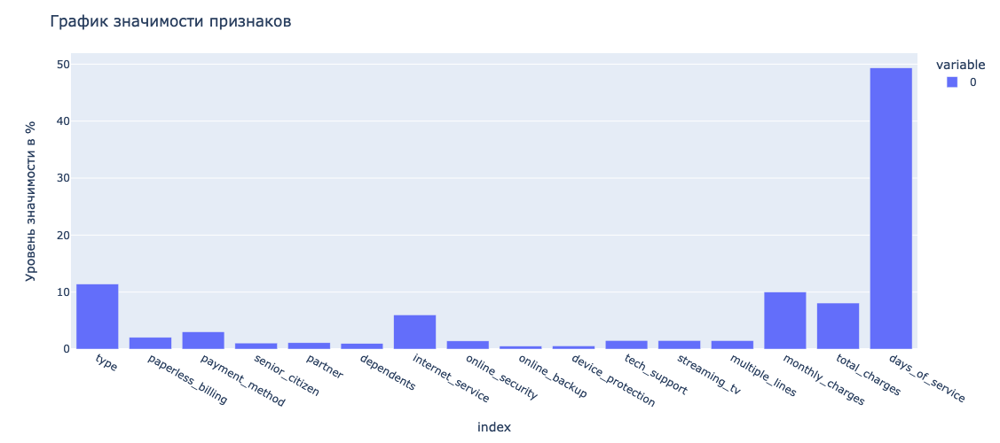

In [88]:
cat_iris_imp = pd.Series(model_cbc.get_feature_importance(),
                         features_train_ord.columns)

fig = px.bar(cat_iris_imp)
# зададим высоту графика и его название
fig.update_layout({'title':'График значимости признаков'}, height=500)
# зададим название оси Y    
fig.update_yaxes({'title':'Уровень значимости в %'})
fig.show()

Как видим наиболее важным признаком является столбец `days_of_service`, также влияют признаки `total_charges`, `monthly_charges`, `type`, `internet_service`

# Выводы и отчет по проекту

В процессе написания проекта создания модели машинного обучения для предсказания потенциального отказа клиентов от услуг компании сделано следующее:

1. Произведено изучение датасетов. По ним мы узнали, что в наличии данные о 7043 клиентах компании, из них 5517 воспользовались услугами предоставления интернета и 6361 услугами телефонной связи.
2. Произведена предобработка данных, в рамкаха которой выполнили объединение данных в один датасет, обработали пропуски, которые возникли после объединения. Также скорретировали названия столбцов, изменили типа данных в нескольких столбцах. Проверили итоговый датасет на наличие аномальных значений и дубликатов.
3. Были добавлены данные для проведения исследовательского анализа и выделен в отдельный столбец целевой признак `refusal`.
4. Проведен исследовательский анализ данных, по которому сделаны следующие наблюдения:
    - количетсво столбцов составило 23 шт., колиечство строк 7043 шт.
    - количество пропусков меньше 0,1%, что не помешает для анализа данных
    - дубликаты отсутствуют
    - в датасете присутствуют данные по 7043 клиентам
    - в датасете дангные за период регистрации с 2013-10-01 по 2020-02-01. Больше всего клиентов зарегистрировалось в 2019 году. По графику видно, что наблюдается постепенный рост спроса к 2020 году
    - 55% клиентов используют систему оплаты услуг `Month-to-month`, 24,1% предпочитают систему оплаты `Two year`, а 20,9% систему `One year`
    - 59,2% клиентов предпочитают безналичный способ оплаты
    - 33,6% клиентов используют метод оплаты `Electronic check`, 22,9% используют `Mailed check`, 21,9% используют `Bank transfer (automatic)` и 21,6% `Credit card (automatic)`
    - минимальная месячная оплата услуг составляет 18.25, а макисмальная составляет 118.75. Средняя оплата составляет 64.76, а медианное значение составляет 70.35
    - минимальная сумма общих затрат клиента на текущую дату составляет 18.8, а максимальная сумма составляет 8684.8. В среднем клиенты потратили на текущую дату 2283.30. Общий доход за рассматриваемый период составили 16 056 169
    - мужчин и женщин среди клиентов примерно поровну (50,5% против 49,5%)
    - среди клиентов только 16,2% пенсионеров
    - 48,3% клиентов состоят в браке и только у 30% клиентов есть дети на иждивении на момент заключения договоров оказания услуг
    - 78,4% клиентов пользуются услгуами предоставления интернета, из них 43,9% пользуются DSL оборудованием, а остальные подключены с применением оптоволоконного оборудования
    - из пользующихся интернет услугами:
        - 36,6% пользуются услугой блокировки небезопасных сайтов
        - 44,0% пользуются услугой облачного хранения файлов для резервного копирования данных
        - 30,9% пользуются услугой антивируса
        - 37,0% пользуются услугой выделенной линии технической поддержки
        - 49,0% пользуются услугой стриминга ТВ
        - 49,5% польузются каталогом фильмов
    - среди клиентов 90,3% пользуются услугами телефоной связи, из них 46,7% пользуются услугой многоканальной связи
    - за рассматриваемый период от услуг компании отказалось 1869 клиентов, что составляет 26,5%, что говорит о том, что каждый четвертый пользователь в последствии отказывается от предоставления услуг
    - на общие затраты клиента заметно влияет месячные траты (коэффициент корреляции - `0,63`), сильно влияет количество дней обслуживания (коэффициент корреляции - `0,88`). Умеренно влияют способ оплаты (коэффициент корреляции - `0,35`), наличие супруга (коэффициент корреляции - `0,32`), предоставление разных интернет услуг (коэффициент корреляции - от `0,35` до `0,52`)
    - на клиента умеренно влияет количество дней обслуживания (коэффициент корреляции - `0,36`), умеренно влияют тип оплаты услуг (коэффициент корреляции - `0,41`), метод оплаты (коэффициент корреляции - `0,30`), предоставление интернет-услуг (коэффициент корреляции - `0,32`)
    - необходимо скорретировать названия столбцов в соответствие с принятым стилем
    - выявлены закономерности почти всех признаков по отношению к целевому признаку
5. Произведена подготовка данных для обучения моделей, в рамках которого:
    - исследовали баланс классов, по которому выяснили, что 26% клиентов уходят из компании. Соответственно данные в целевом признаке были не сбалансированы. Чуть позже 
    - разделили данные на признаки и целевой признак и на отдельные обучающую и тестовую выборки
    - определили признаки: `type`, `paperless_billing`, `payment_method`, `senior_citizen`, `partner`, `dependents`, `internet_service`, `online_security`, `online_backup`, `device_protection`, `tech_support`, `streaming_tv`, `multiple_lines`, `monthly_charges`, `total_charges`, `days_of_service`
    - произвели порядковое кодирование признаков
    - устранили дисбаланс классов на обучающей выборке методом SMOTE
    - произвели масштабирование, т.к. для обучения использовали линейные модели
6. Обучили следующие модели с полученными метриками ROC-AUC:
    - модель логистической регрессии (ROC-AUC - 0,85)
    - модель дерева решений (ROC-AUC - 0,84)
    - модель случайного леса (ROC-AUC - 0,86)
    - модель дерева принятия решений с градиентным бустингом (ROC-AUC - 0,89)
    - модель односторонней выборки на основе градиента GOSS (ROC-AUC - 0,88)
    - модель, обученная с помощью RNN через библиотеку tensorflow (ROC-AUC - 0,82)
    - моедль градиентного бустинга CatBoost (ROC-AUC - 0,90)
    При этом стоит отметить, что для модели логистической регрессии применялась обучающая выборка после масштабирования и устранения дисбаланса классов, а во всех остальных случаях применалась обучающая выборка после кодирования

    - наибольший показатель ROC-AUC получили на модели CatBoostClassifier - 0,905. Для которой были подобраны следущие параметры:
        - 'depth': 5
        - 'l2_leaf_reg': 3 
        - 'learning_rate': 0.03
        - 'min_child_samples': 15
        - 'random_state': 27022023
7. Провели финальное тестирование, в рамках которого:
    - определили качество модели градиентного бустинга CatBoost на тестовой выборке и получилис следующие результаты:
        accuracy: 0.852
        roc_auc: 0.895
        recall: 0.597
        precision: 0.777
    - определили значимость признаков, по которому основным признаком оказалось количество дней оказания услуг для клиента. также важны тип договора, уровень месячных затрат и наличие оказания услуг доступа в интернет
    - построили матрицй ошибок, по которой доля правильных ответов составила 82,6%, при этом показатель Recall составляет - 0,87, а показатель Precision - 0,93
    
В рамках выполнения проекта выполнена основная цель, согласно которой была построена модель, которая позволит определять клиентов, которые потенциально могут отказаться от услуг, в перспективе с возможностью определения мероприятий, предложений для таких клиентов с целевой метриков ROC-AUC больше 0,85.

Все изначально намеченные пункты планы написания проекта выполнены. Основные сложности возникли при написании модели RNN на базе библиотеки Tensorflow из-за особенностей архитектуры процессора M1 PRO. Данную проблему решил путем полной переустановки Python в отдельное виртуальное окружение с применением homebrew и через miniforge.

Ключевыми шагами к решению задачи были:
- составление плана и определение цели и основных метрик качества, которые необходимо было достигнуть
- взаимодействие с тимлидом и куратором ЯП по вопросу организации выполнения задачи
- выделение в отдельный признак количества дней обслуживания
- определение и выделение отдельно целевого признака
- проведение анализа данных, по которому определили признаки для обучения моделей
- применение библиотеки CatBoost. Применяли ее впервые

